In [2]:
from skimage import io
from skimage.util import img_as_ubyte
import matplotlib.pyplot as plt
import numpy as np
import glob
from sklearn.decomposition import PCA
from skimage.transform import SimilarityTransform
from skimage.transform import warp
import os
import pathlib

### EX1 Preprocess cat images

In [24]:
data_dir = 'data/'
model_cat = 'ModelCat.jpg'

In [29]:
def read_landmark_file(file_name):
    f = open(file_name, 'r')
    lm_s = f.readline().strip().split(' ')
    n_lms = int(lm_s[0])
    if n_lms < 3:
        print(f"Not enough landmarks found")
        return None

    new_lms = 3
    # 3 landmarks each with (x,y)
    lm = np.zeros((new_lms, 2))
    for i in range(new_lms):
        lm[i, 0] = lm_s[1 + i * 2]
        lm[i, 1] = lm_s[2 + i * 2]
    #Transform to int   
    return lm.astype(int)
    return lm

In [36]:
#Test
lm_model = read_landmark_file(data_dir+model_cat+'.cat')


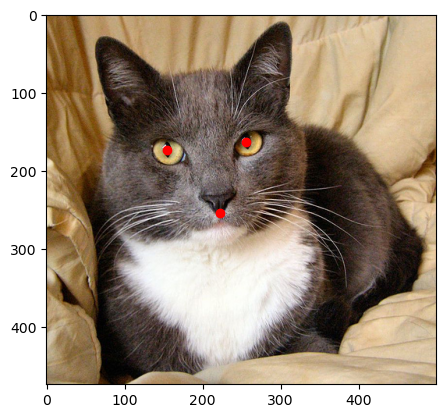

In [38]:
img_modelcat = io.imread(data_dir + model_cat)
#Plot coordinates of landmarks on image
plt.figure()
plt.imshow(img_modelcat)
plt.plot(lm_model[:,0], lm_model[:,1], 'ro')
plt.show()

In [48]:
img_modelcat.shape

(474, 500, 3)

In [52]:
def align_and_crop_one_cat_to_destination_cat(img_src, lm_src, img_dst, lm_dst):
    """
    Landmark based alignment of one cat image to a destination
    :param img_src: Image of source cat
    :param lm_src: Landmarks for source cat
    :param lm_dst: Landmarks for destination cat
    :return: Warped and cropped source image. None if something did not work
    """
    tform = SimilarityTransform()
    tform.estimate(lm_src, lm_dst)
    warped = warp(img_src, tform.inverse, output_shape=img_dst.shape)

    # Center of crop region
    cy = 185
    cx = 210
    # half the size of the crop box
    sz = 180
    warp_crop = warped[cy - sz:cy + sz, cx - sz:cx + sz]
    shape = warp_crop.shape
    if shape[0] == sz * 2 and shape[1] == sz * 2:
        return img_as_ubyte(warp_crop)
    else:
        print(f"Could not crop image. It has shape {shape}. Probably to close to border of image")
        return None

In [53]:
def show_comparison(original, transformed, transformed_name):
    fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(8, 4), sharex=True,
                                   sharey=True)
    ax1.imshow(original)
    ax1.set_title('Original')
    ax1.axis('off')
    ax2.imshow(transformed)
    ax2.set_title(transformed_name)
    ax2.axis('off')
    io.show()

In [54]:
#Transform the MissingCat image and show the comparison of the original and the transformed image
img_missingcat = io.imread(data_dir + 'MissingCat.jpg')
lm_missingcat = read_landmark_file(data_dir+'MissingCat.jpg.cat')
img_missingcat_aligned = align_and_crop_one_cat_to_destination_cat(img_missingcat, lm_missingcat, img_modelcat, lm_model)


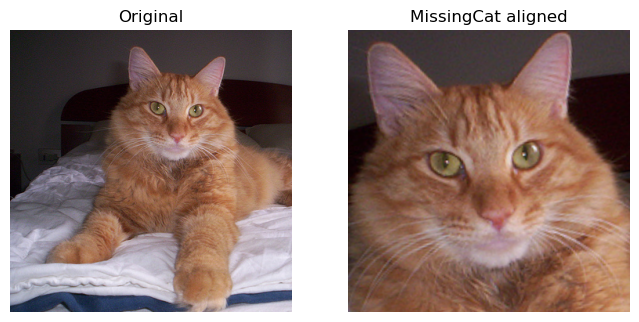

In [55]:
show_comparison(img_missingcat, img_missingcat_aligned, 'MissingCat aligned')

In [45]:
def preprocess_all_cats(in_dir, out_dir):
    """
    Create aligned and cropped version of image
    :param in_dir: Where are the original photos and landmark files
    :param out_dir: Where should the preprocessed files be placed
    """
    dst = "data/ModelCat"
    dst_lm = read_landmark_file(f"{dst}.jpg.cat")
    dst_img = io.imread(f"{dst}.jpg")

    all_images = glob.glob(in_dir + "*.jpg")
    for img_idx in all_images:
        name_no_ext = os.path.splitext(img_idx)[0]
        base_name = os.path.basename(name_no_ext)
        out_name = f"{out_dir}/{base_name}_preprocessed.jpg"

        src_lm = read_landmark_file(f"{name_no_ext}.jpg.cat")
        src_img = io.imread(f"{name_no_ext}.jpg")

        proc_img = align_and_crop_one_cat_to_destination_cat(src_img, src_lm, dst_img, dst_lm)
        if proc_img is not None:
            io.imsave(out_name, proc_img)

In [75]:
#Small dataset
#preprocess_all_cats("largeData/training_cats_100/", "largeData/preprocessed")

#large dataset
preprocess_all_cats("largeData/training_cats/", "largeData/preprocessed")

C:\Users\Jesper\AppData\Local\Temp\ipykernel_27496\3192831975.py:22: UserWarning: largeData/preprocessed/00000059_002_preprocessed.jpg is a low contrast image
  io.imsave(out_name, proc_img)


### Exercise 2, Gathering data into a data matrix

In [76]:
#Number of images

preprocess_list = glob.glob("largeData/preprocessed/*.jpg")
n_samles = len(preprocess_list)
print(f"Number of samples: {n_samles}")

Number of samples: 1706


In [77]:
#Size of image
img_dim = io.imread(preprocess_list[0]).shape
n_features = img_dim[0] * img_dim[1] * img_dim[2]
print(f"Dim of image: {img_dim}, number of features: {n_features}")

Dim of image: (360, 360, 3), number of features: 388800


In [78]:
def create_data_matrix(input_dir):
    """
    Create a data matrix from all images in a directory
    :param input_dir: Directory with images
    :return: Data matrix, data_matrix[idx, :] = flat_img
    """
    all_images = glob.glob(input_dir + "*.jpg")
    n_samples = len(all_images)
    img_dim = io.imread(all_images[0]).shape
    n_features = img_dim[0] * img_dim[1] * img_dim[2]
    data_matrix = np.zeros((n_samples, n_features))
    for idx, img in enumerate(all_images):
        flat_img = io.imread(img).flatten()
        data_matrix[idx, :] = flat_img
    return data_matrix

In [79]:
data_matrix = create_data_matrix("largeData/preprocessed/")

In [80]:
#Cat 1
data_matrix[0]

array([114.,  88.,  75., ...,  28.,  24.,  23.])

### Compute and visualize a mean cat (LoL)

In [81]:
#Calculate mean image of data matrix
mean_cat = np.mean(data_matrix, axis=0)

In [82]:
def create_u_byte_image_from_vector(im_vec, height, width, channels):
    min_val = im_vec.min()
    max_val = im_vec.max()

    # Transform to [0, 1]
    im_vec = np.subtract(im_vec, min_val)
    im_vec = np.divide(im_vec, max_val - min_val)
    im_vec = im_vec.reshape(height, width, channels)
    im_out = img_as_ubyte(im_vec)
    return im_out

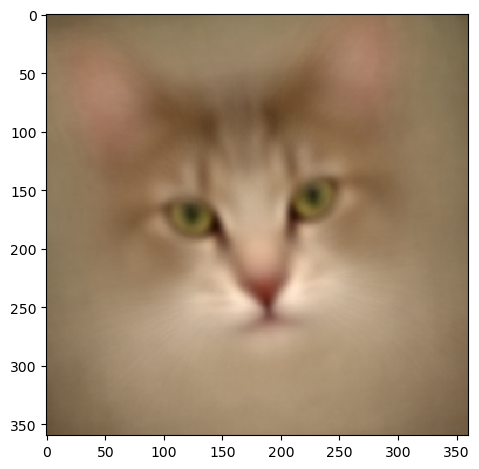

In [83]:
mean_img = create_u_byte_image_from_vector(mean_cat, img_dim[0], img_dim[1], img_dim[2])
io.imshow(mean_img)

### EX 6, 7, 8, 9, 10, 11 Find a missing cat - or lookalike!

In [84]:
def preprocess_one_cat():
    src = "data/MissingCat"
    dst = "data/ModelCat"
    out = "data/MissingCatProcessed.jpg"

    src_lm = read_landmark_file(f"{src}.jpg.cat")
    dst_lm = read_landmark_file(f"{dst}.jpg.cat")

    src_img = io.imread(f"{src}.jpg")
    dst_img = io.imread(f"{dst}.jpg")

    src_proc = align_and_crop_one_cat_to_destination_cat(src_img, src_lm, dst_img, dst_lm)
    if src_proc is None:
        return

    io.imsave(out, src_proc)

    fig, ax = plt.subplots(ncols=3, figsize=(16, 6))
    ax[0].imshow(src_img)
    ax[0].plot(src_lm[:, 0], src_lm[:, 1], '.r', markersize=12)
    ax[1].imshow(dst_img)
    ax[1].plot(dst_lm[:, 0], dst_lm[:, 1], '.r', markersize=12)
    ax[2].imshow(src_proc)
    for a in ax:
        a.axis('off')
    plt.tight_layout()
    plt.show()

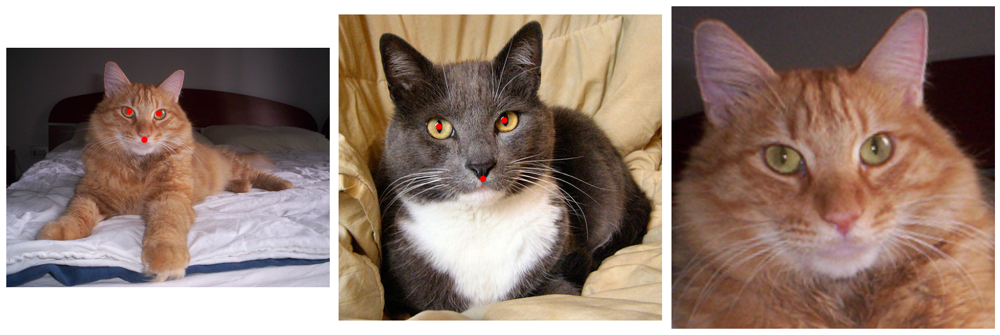

In [85]:
preprocess_one_cat()

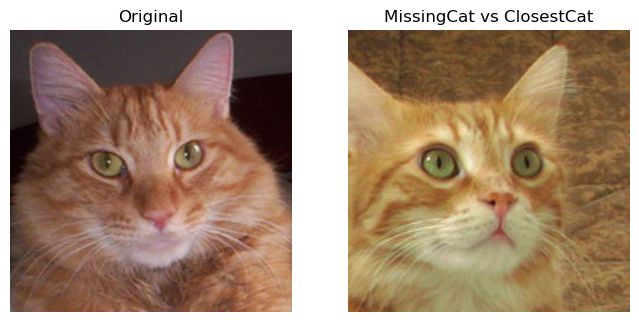

In [86]:
#Flatten image of missingCatProcessed 
missingCatProcessed = io.imread("data/MissingCatProcessed.jpg")
miss_flat = missingCatProcessed.flatten()

#Calculate distance between mean image and missingCatProcessed

sub_data = data_matrix - miss_flat
sub_dist = np.linalg.norm(sub_data, axis=1)

#Find the closest cat to the missingCatProcessed
closest_idx = np.argmin(sub_dist)

#Show the closest cat in comparison to the missingCatProcessed
closest_cat = data_matrix[closest_idx, :]
closest_cat = create_u_byte_image_from_vector(closest_cat, img_dim[0], img_dim[1], img_dim[2])
show_comparison(missingCatProcessed, closest_cat, 'MissingCat vs ClosestCat')

### Least looking cat

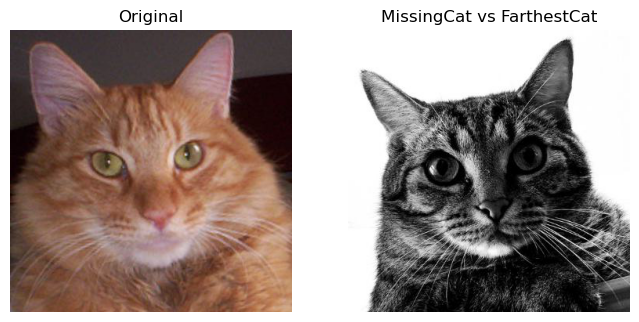

In [87]:
#Show the least similar cat in comparison to the missingCatProcessed
farthest_idx = np.argmax(sub_dist)
farthest_cat = data_matrix[farthest_idx, :]
farthest_cat = create_u_byte_image_from_vector(farthest_cat, img_dim[0], img_dim[1], img_dim[2])
show_comparison(missingCatProcessed, farthest_cat, 'MissingCat vs FarthestCat')

# PCA of the cats

### Ex 12, 13, 14 , 15 16
Start by computing first 50 PCs

In [141]:
from sklearn.decomposition import PCA

cats_pca = PCA(n_components=50)
cats_pca.fit(data_matrix)

PCA(n_components=50)

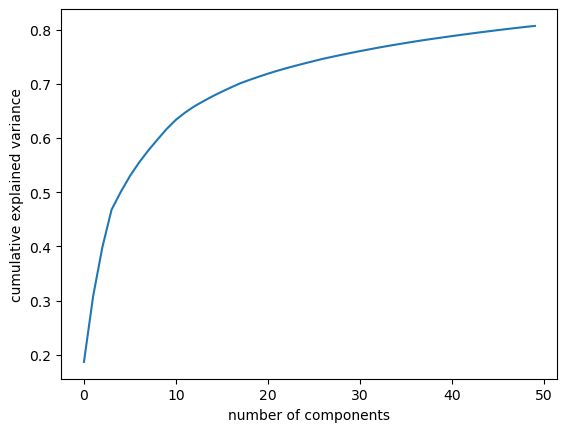

In [142]:
#Plot the explained variance
plt.plot(np.cumsum(cats_pca.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance');
plt.show()

In [143]:
#How much is explained by the first component
print(f"Explained variance by first component: {cats_pca.explained_variance_ratio_[0]*100:.2f}%")

Explained variance by first component: 18.71%


In [144]:
#Project the data matrix into the 50 dimensional space
data_matrix_pca = cats_pca.transform(data_matrix)


In [145]:
#Project the missing cat into the 50 dimensional space
miss_pca = cats_pca.transform(miss_flat.reshape(1, -1))

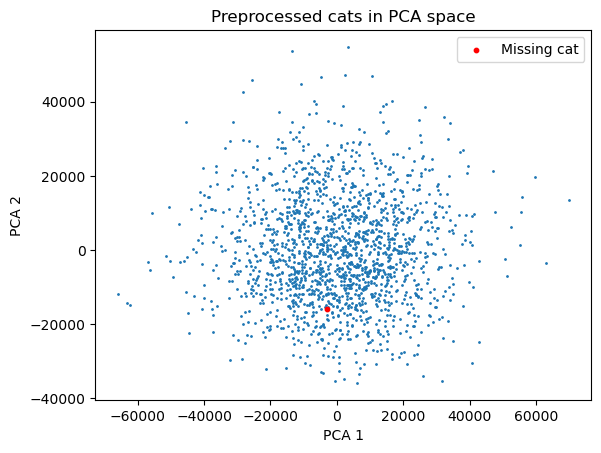

In [146]:
#Plot the first two components add the missing cat and label it
plt.scatter(data_matrix_pca[:, 0], data_matrix_pca[:, 1], s=1)
plt.scatter(miss_pca[:, 0], miss_pca[:, 1], s=10, c='r', label='Missing cat')
plt.title('Preprocessed cats in PCA space')
plt.legend()
plt.xlabel('PCA 1')
plt.ylabel('PCA 2')
plt.show()

### Ex 17, 18: Cats in space

**Extreme cat**
Find the cats with most extreme coordinates in the PCA space PCA1 PCA2 and plot them, should they be removed?

Ids of the cats that have extreme values in the first and second PCA coordinates: [409, 469, 20, 347]


c:\ProgramData\Anaconda3\envs\imageanalysis\lib\site-packages\skimage\io\_plugins\matplotlib_plugin.py:150: UserWarning: Low image data range; displaying image with stretched contrast.
  lo, hi, cmap = _get_display_range(image)


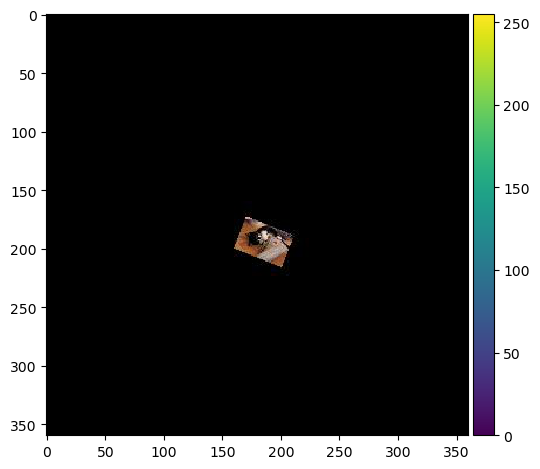

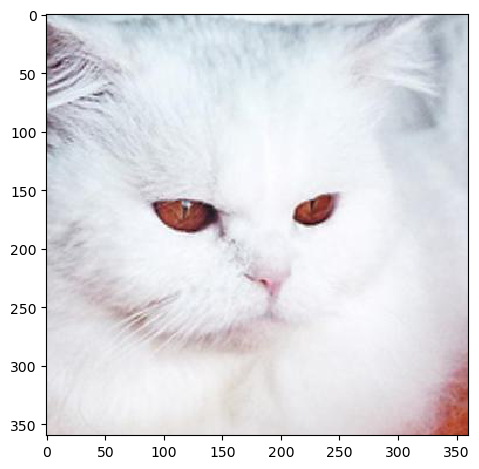

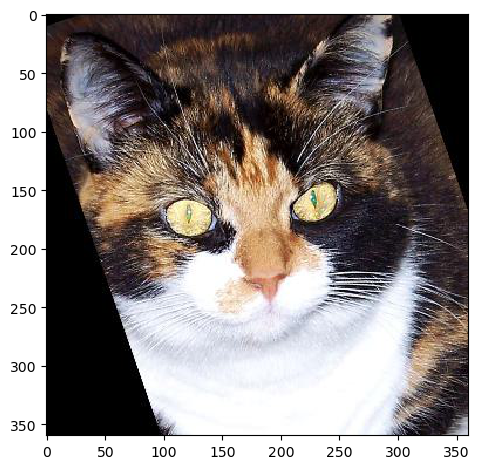

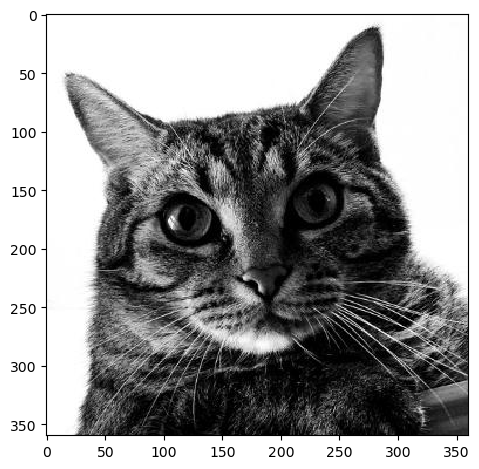

In [147]:
#Use np.argmin and np.argmax to find the ids of the cats that have extreme values in the first and second PCA coordinates.
min_pca = np.argmin(data_matrix_pca[:, 0])
max_pca = np.argmax(data_matrix_pca[:, 0])
min_pca2 = np.argmin(data_matrix_pca[:, 1])
max_pca2 = np.argmax(data_matrix_pca[:, 1])

#Join the ids of the cats that have extreme values in the first and second PCA coordinates.
min_max_pca = [min_pca, max_pca, min_pca2, max_pca2]
print(f"Ids of the cats that have extreme values in the first and second PCA coordinates: {min_max_pca}")

#Loop over the ids and show the corresponding cats.
for i in min_max_pca:
    cat = data_matrix[i, :]
    cat = create_u_byte_image_from_vector(cat, img_dim[0], img_dim[1], img_dim[2])
    io.imshow(cat)
    plt.show()

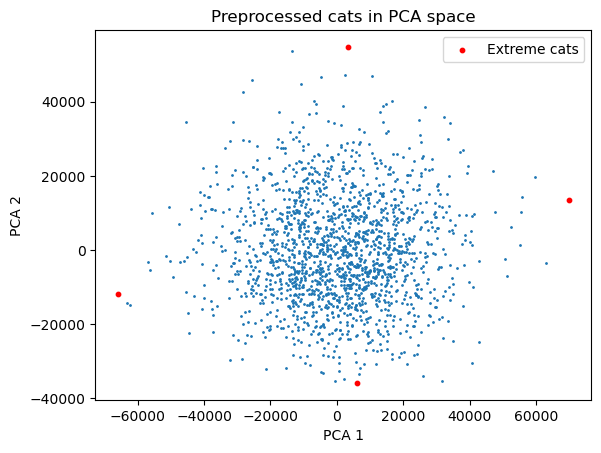

In [148]:

#Plot 4 cats that have extreme values in the first and second PCA coordinates in the scatter plot

plt.scatter(data_matrix_pca[:, 0], data_matrix_pca[:, 1], s=1)
#Plot the 4 cats that have extreme values in the first and second PCA coordinates in the scatter plot using the indexes from min_max_pca
plt.scatter(data_matrix_pca[min_max_pca, 0], data_matrix_pca[min_max_pca, 1], s=10, c='r', label='Extreme cats')
plt.title('Preprocessed cats in PCA space')
plt.legend()
plt.xlabel('PCA 1')
plt.ylabel('PCA 2')
plt.show()

In [149]:
#Remove the 4 IDs of the cats that have extreme values from the data matrix 
def remove_rows(d_m, rows):
    return np.delete(d_m, rows, axis=0)

data_matrix_cleaned = remove_rows(data_matrix, min_max_pca)

def train_pca(d_m):
    cats_pca = PCA(n_components=50)
    cats_pca.fit(d_m)
    return cats_pca

cats_pca_cleaned = train_pca(data_matrix_cleaned)

def transform_data(d_m, pca_model):
    return pca_model.transform(d_m)

data_matrix_pca_cleaned = transform_data(data_matrix_cleaned, cats_pca_cleaned)

#Retrain the PCA model on the cleaned data matrix


Ids of the cats that have extreme values in the first and second PCA coordinates: [1333, 1341, 1388, 846]


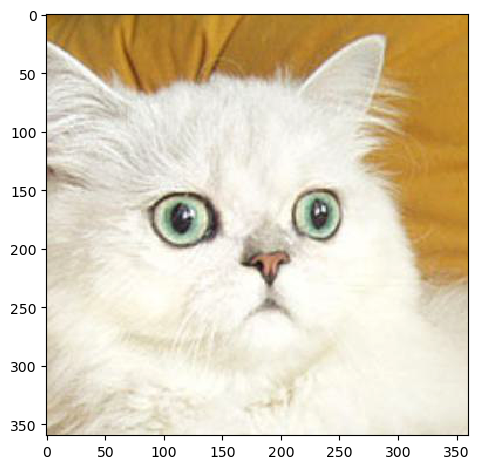

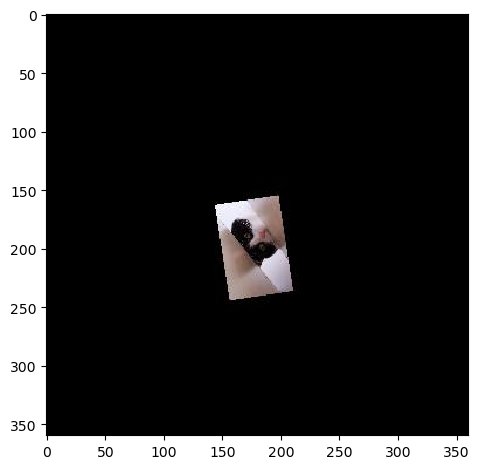

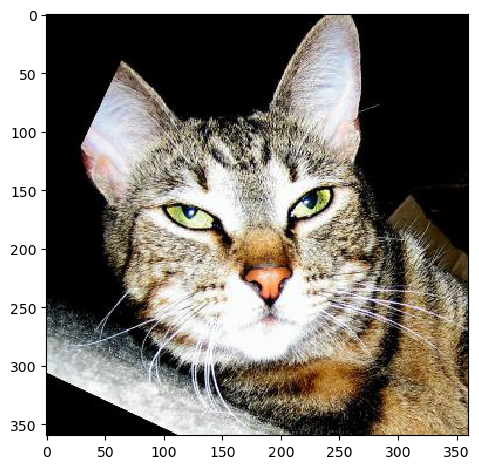

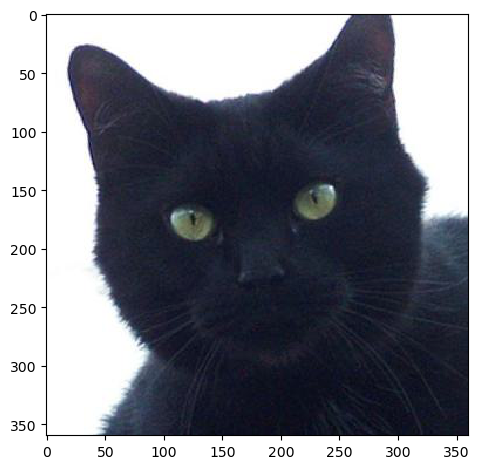

In [150]:
#Use np.argmin and np.argmax to find the ids of the cats that have extreme values in the first and second PCA coordinates.
def extreme_cats(d_m_pca):
    #use argmin and argmax to find the outliers on PC1 and PC and return a list of IDs
    min_pca = np.argmin(d_m_pca[:, 0])
    max_pca = np.argmax(d_m_pca[:, 0])
    min_pca2 = np.argmin(d_m_pca[:, 1])
    max_pca2 = np.argmax(d_m_pca[:, 1])
    return [min_pca, max_pca, min_pca2, max_pca2]


min_max_pca = extreme_cats(data_matrix_pca_cleaned)
print(f"Ids of the cats that have extreme values in the first and second PCA coordinates: {min_max_pca}")

def display_cats(d_m, ids):
    #Loop over the ids and show the corresponding cats.
    for i in ids:
        cat = d_m[i, :]
        cat = create_u_byte_image_from_vector(cat, img_dim[0], img_dim[1], img_dim[2])
        io.imshow(cat)
        plt.show()

display_cats(data_matrix_cleaned, min_max_pca)

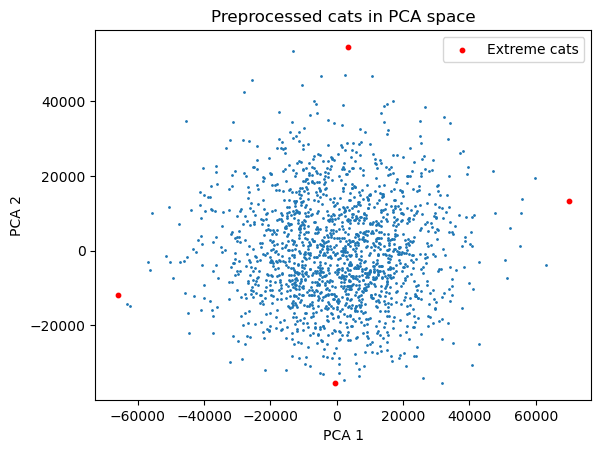

In [136]:
#Plot 4 cats that have extreme values in the first and second PCA coordinates in the scatter plot

def scatter_cats(d_m_pca, ids):
    plt.scatter(d_m_pca[:, 0], d_m_pca[:, 1], s=1)
    #Plot the 4 cats that have extreme values in the first and second PCA coordinates in the scatter plot using the indexes from min_max_pca
    plt.scatter(d_m_pca[ids, 0], d_m_pca[ids, 1], s=10, c='r', label='Extreme cats')
    plt.title('Preprocessed cats in PCA space')
    plt.legend()
    plt.xlabel('PCA 1')
    plt.ylabel('PCA 2')
    plt.show()

scatter_cats(data_matrix_pca_cleaned, min_max_pca)

c:\ProgramData\Anaconda3\envs\imageanalysis\lib\site-packages\skimage\io\_plugins\matplotlib_plugin.py:150: UserWarning: Low image data range; displaying image with stretched contrast.
  lo, hi, cmap = _get_display_range(image)


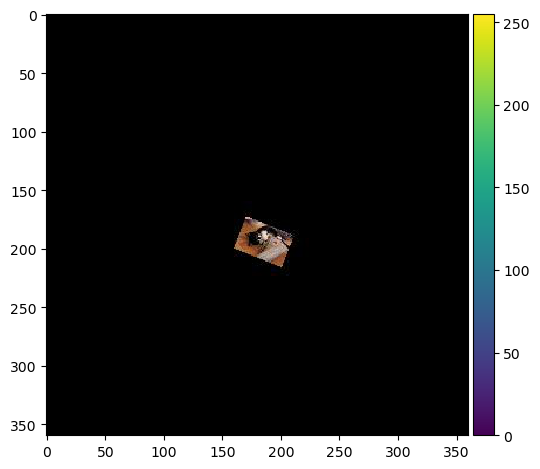

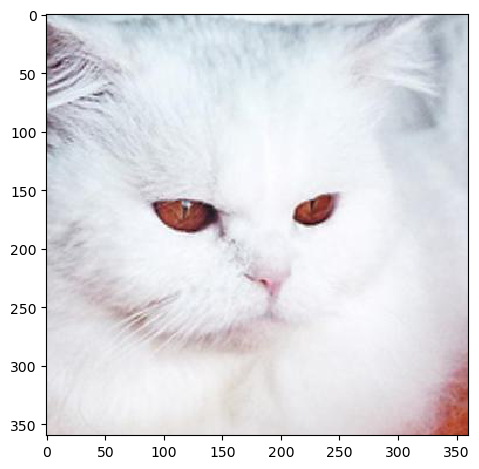

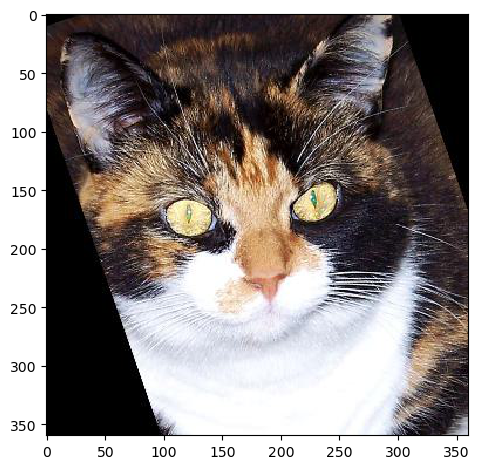

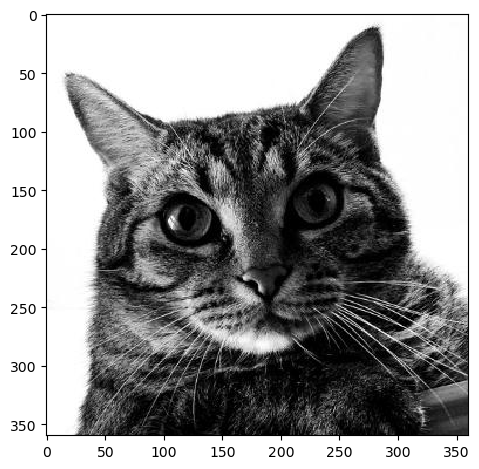

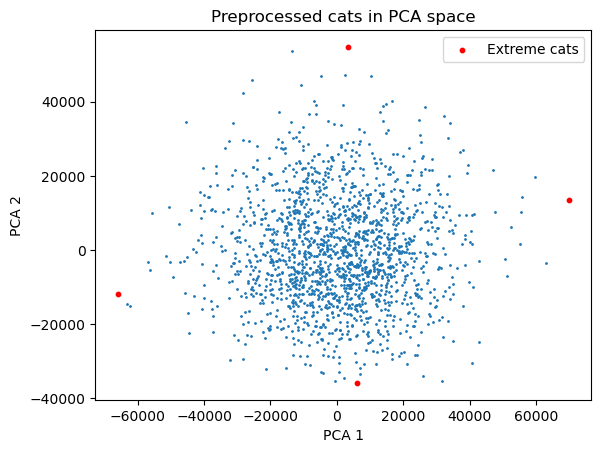

In [151]:
#Remove the 4 IDs of the cats that have extreme values from the data matrix
data_matrix_cleaned = remove_rows(data_matrix, min_max_pca)
#Retrain the PCA model on the cleaned data matrix
cats_pca_cleaned = train_pca(data_matrix_cleaned)
#Transform the data matrix
data_matrix_pca_cleaned = transform_data(data_matrix_cleaned, cats_pca_cleaned)
#Find the outliers
min_max_pca = extreme_cats(data_matrix_pca_cleaned)
#Plot the outliers
display_cats(data_matrix_cleaned, min_max_pca)
#Plot the outliers in the scatter plot
scatter_cats(data_matrix_pca_cleaned, min_max_pca)


### Serious Cleaning
**Cleaning the 4 most extreme cats was not enough** 
Removing the furthest 30 outliers.

In [152]:
#Discard the n furthest outliers on the PC1 and PC2 axes
def remove_outliers(d_m, d_m_pca, n):
    #Find the ids of the n furthest outliers on PC1 and PC2
    ids = np.argsort(np.linalg.norm(d_m_pca[:, :2], axis=1))[-n:]
    #Remove the outliers from the data matrix
    scatter_cats(d_m_pca, ids)
    d_m_c = remove_rows(d_m, ids)
    return d_m_c

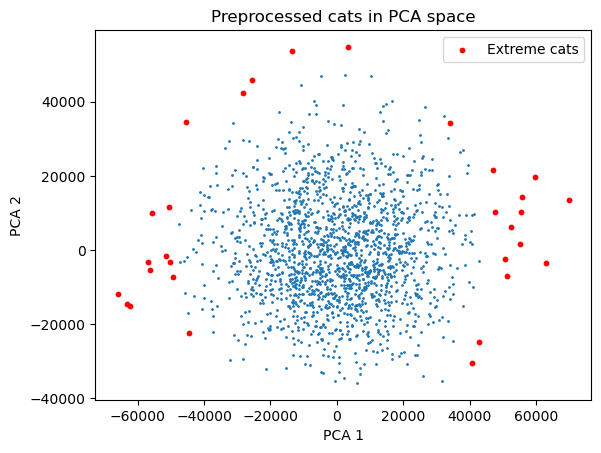

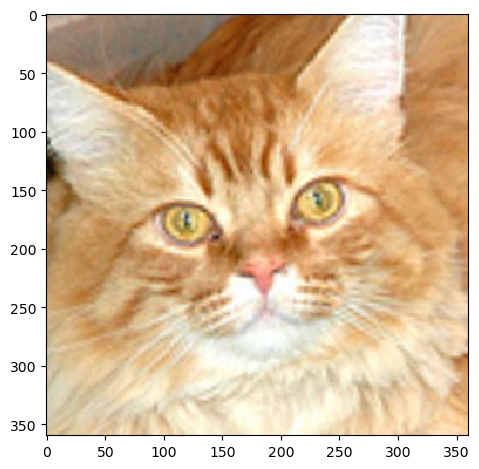

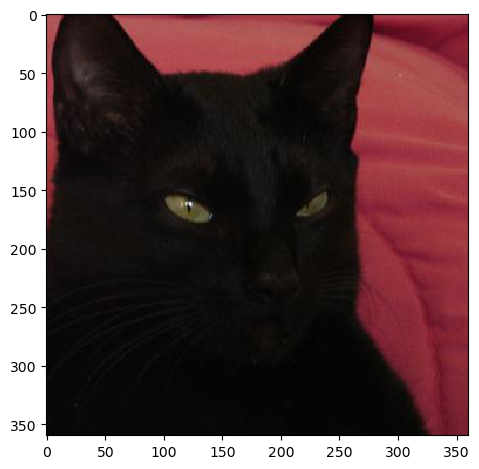

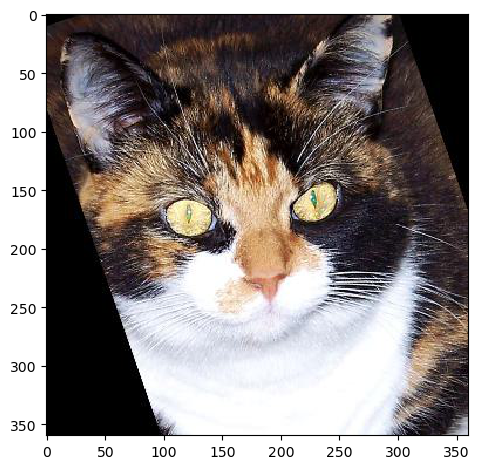

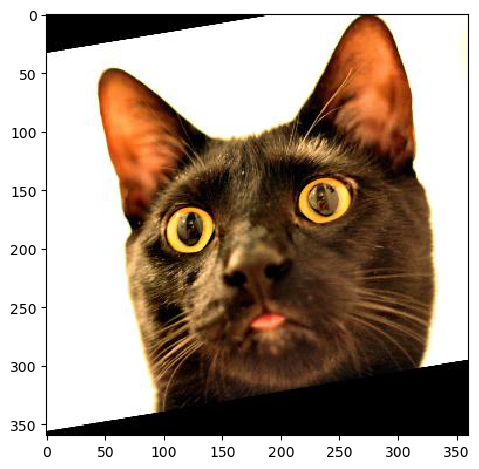

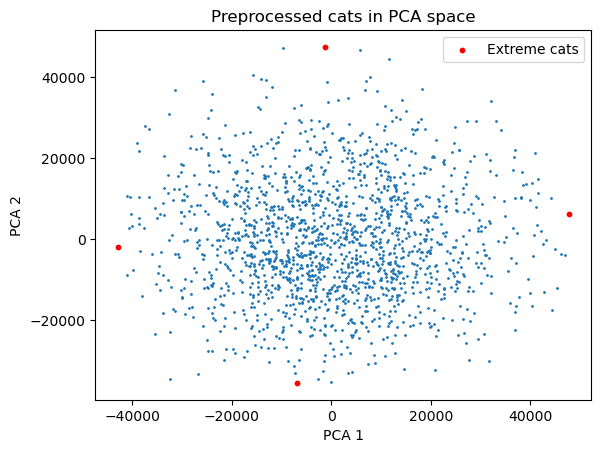

In [153]:
#Remove 30 outliers
data_matrix_cleaned = remove_outliers(data_matrix_cleaned, data_matrix_pca_cleaned, 30)
#Retrain the PCA model on the cleaned data matrix
cats_pca_cleaned = train_pca(data_matrix_cleaned)
#Transform the data matrix
data_matrix_pca_cleaned = transform_data(data_matrix_cleaned, cats_pca_cleaned)
#Find the outliers
min_max_pca = extreme_cats(data_matrix_pca_cleaned)
#Plot the outliers
display_cats(data_matrix_cleaned, min_max_pca)
#Plot the outliers in the scatter plot
scatter_cats(data_matrix_pca_cleaned, min_max_pca)


This looks good enough

## Cat Syntheziser
We can use the PCA to make a so-called generative model that can create synthetic samples from the learnt data. It is done by adding a linear combination of principal components to the average cat image:

where we 
 is the first principal component, 
 the second and so on. Here we use 
 principal components.

The principal components are stored in cats_pca.components_. So the first principal component is cats_pca.components_[0, :] .

In [158]:
cats_pca_cleaned.components_[0,:]

array([-0.00080131, -0.00082291, -0.00082853, ..., -0.00174027,
       -0.00169656, -0.00164787])

In [163]:
average_cat

array([-2.07007957e-11,  7.89280390e-12,  1.42244536e-12, -2.88405557e-12,
        5.96175953e-13, -1.24239587e-11, -1.12544530e-12, -2.85440996e-12,
        4.16126463e-12, -9.38759543e-12, -1.70231081e-12,  3.97359976e-13,
        3.08096770e-12, -3.40516557e-13,  1.03351671e-14, -3.95564921e-12,
        2.56556923e-12, -2.46684119e-12, -1.32602913e-12,  9.74701447e-13,
       -3.82061209e-12, -5.64082539e-13,  2.13693178e-12, -1.17712113e-12,
        1.60086298e-12,  7.19110045e-13,  2.27373675e-13,  6.91776248e-13,
        2.50219834e-13, -8.52379305e-13,  6.36972665e-13, -6.66890254e-13,
       -3.05295396e-12, -3.75520136e-12, -3.19710234e-13, -1.51818165e-12,
        1.54755528e-13, -1.35961843e-12,  1.60059100e-13, -1.86168996e-12,
        8.39596335e-13,  2.52844423e-12,  7.12310593e-13, -9.57090866e-13,
        1.70212382e-12, -1.22675713e-12,  7.24617601e-13,  1.86862540e-12,
       -1.22934092e-12, -3.30589357e-13])

In [189]:
np.min(data_matrix_pca_cleaned[:,1])

-35581.429520658916

In [190]:

import random

#w1 = random.randint(-40000, 40000)
#w2 = random.randint(-25000, 40000)
#synth_cat = average_cat + pca_model.components_[0,:] * w1 + pca_model.components_[1,:] * w2

def cat_generator(d_m, d_m_pca,pca_model, w_n):
    #Generate a random cat by adding a random weight to the average cat and the first w_n principal components
    
    gen_cat = d_m.mean(axis=0)
    for i in range(w_n):
        #Find min and max values in the i-th PCA coordinate
        w = random.randint(int(np.min(d_m_pca[:, i])), int(np.max(d_m_pca[:, i])))
        gen_cat += pca_model.components_[i,:] * w
    return gen_cat


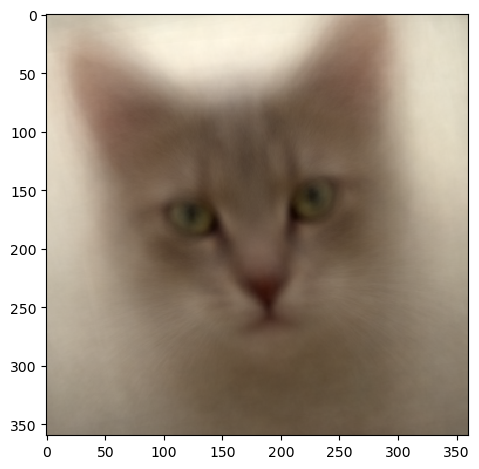

In [221]:

synth_cat = cat_generator(data_matrix_cleaned, data_matrix_pca_cleaned, cats_pca_cleaned, 2)
#Show the synthetic cat
io.imshow(create_u_byte_image_from_vector(synth_cat, img_dim[0], img_dim[1], img_dim[2]))

### Variations in dataset

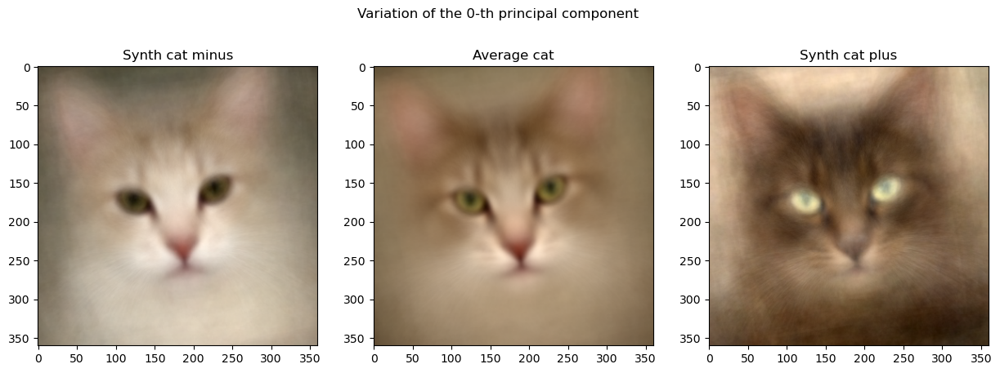

In [202]:
#Create a plot of the synth cat minus to the left, average cat in the middle and synth cat plus to the right
def variation_plot(d_m, pca_model, m):
    average_cat = d_m.mean(axis=0)
    synth_cat_plus = average_cat + 3 * np.sqrt(pca_model.explained_variance_[m]) * pca_model.components_[m, :]
    synth_cat_minus = average_cat - 3 * np.sqrt(pca_model.explained_variance_[m]) * pca_model.components_[m, :]
    fig, ax = plt.subplots(1, 3, figsize=(15, 5))
    fig.suptitle('Variation of the {}-th principal component'.format(m))
    ax[0].imshow(create_u_byte_image_from_vector(synth_cat_minus, img_dim[0], img_dim[1], img_dim[2]))
    ax[0].set_title('Synth cat minus')
    ax[1].imshow(create_u_byte_image_from_vector(average_cat, img_dim[0], img_dim[1], img_dim[2]))
    ax[1].set_title('Average cat')
    ax[2].imshow(create_u_byte_image_from_vector(synth_cat_plus, img_dim[0], img_dim[1], img_dim[2]))
    ax[2].set_title('Synth cat plus')
    plt.show()
    
variation_plot(data_matrix_cleaned, cats_pca_cleaned, 0)


Seem to relate to the color of the eyes, and of the fur

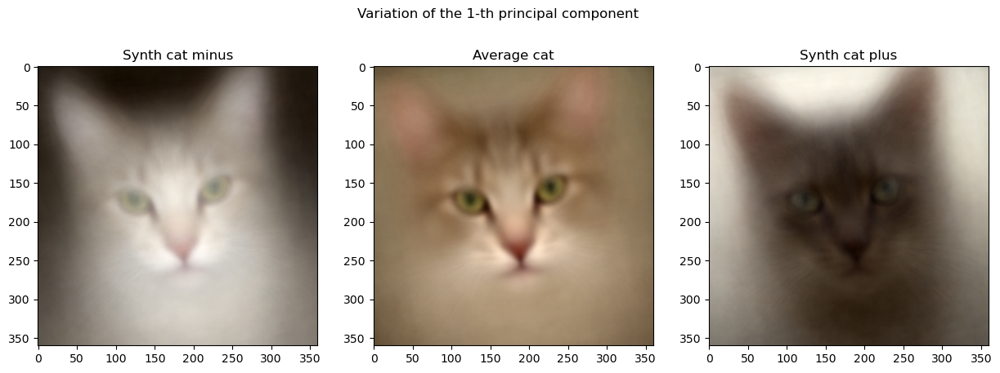

In [203]:
variation_plot(data_matrix_cleaned, cats_pca_cleaned, 1)

Seem to relate to the contrast between fur and background

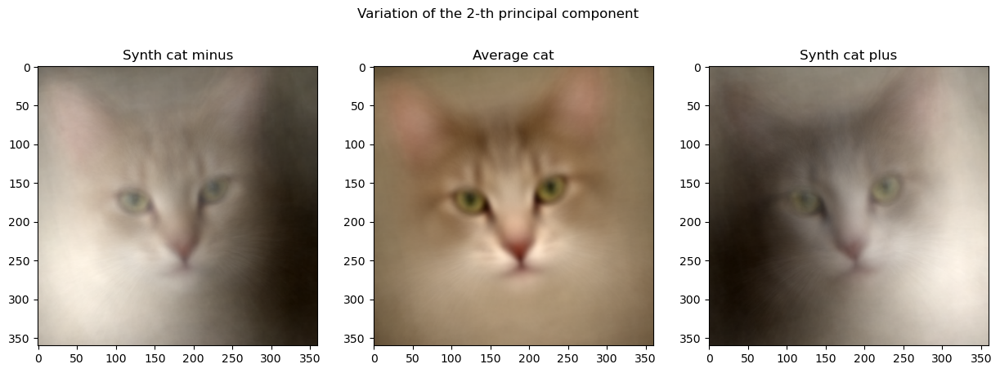

In [204]:
variation_plot(data_matrix_cleaned, cats_pca_cleaned, 2)

Seem to relate to the spread of light, whether there is more dark on the right side, or left side of the image

### Ex 23, the Cat synthesizer

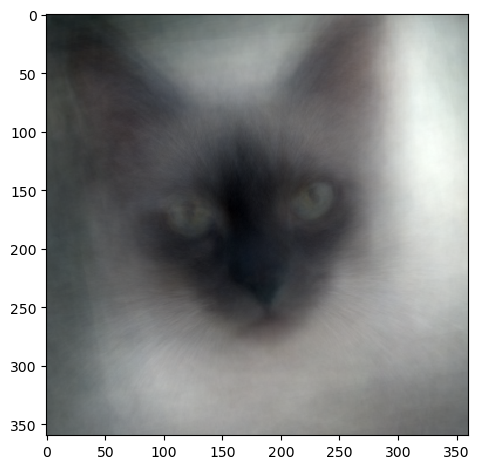

In [222]:
average_cat = data_matrix_cleaned.mean(axis=0)

n_components_to_use = 10
synth_cat = average_cat
for idx in range(n_components_to_use):
	w = random.uniform(-1, 1) * 3 * np.sqrt(cats_pca_cleaned.explained_variance_[idx])
	synth_cat = synth_cat + w * cats_pca_cleaned.components_[idx, :]
 
io.imshow(create_u_byte_image_from_vector(synth_cat, img_dim[0], img_dim[1], img_dim[2]))

### Cat identifier in PCA

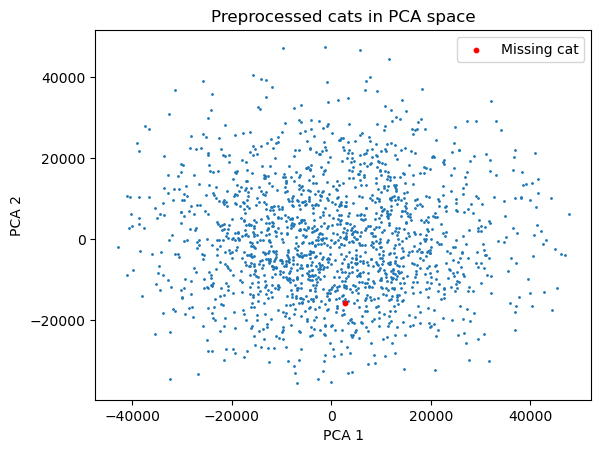

In [224]:
im_miss = io.imread("data/MissingCatProcessed.jpg")
im_miss_flat = im_miss.flatten()
im_miss_flat = im_miss_flat.reshape(1, -1)
pca_coords = cats_pca_cleaned.transform(im_miss_flat)
pca_coords = pca_coords.flatten()

#Plot the first two components add the missing cat and label it
plt.scatter(data_matrix_pca_cleaned[:, 0], data_matrix_pca_cleaned[:, 1], s=1)
plt.scatter(pca_coords[0], pca_coords[1], s=10, c='r', label='Missing cat')
plt.title('Preprocessed cats in PCA space')
plt.legend()
plt.xlabel('PCA 1')
plt.ylabel('PCA 2')
plt.show()

Plenty of similar cats around!

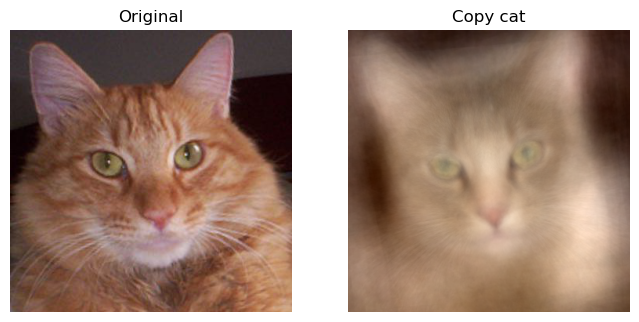

In [238]:
n_components_to_use = 50
copy_cat = average_cat
for idx in range(n_components_to_use):
	copy_cat = copy_cat + pca_coords[idx] * cats_pca.components_[idx, :]
 
show_comparison(im_miss, create_u_byte_image_from_vector(copy_cat, img_dim[0], img_dim[1], img_dim[2]), 'Copy cat')

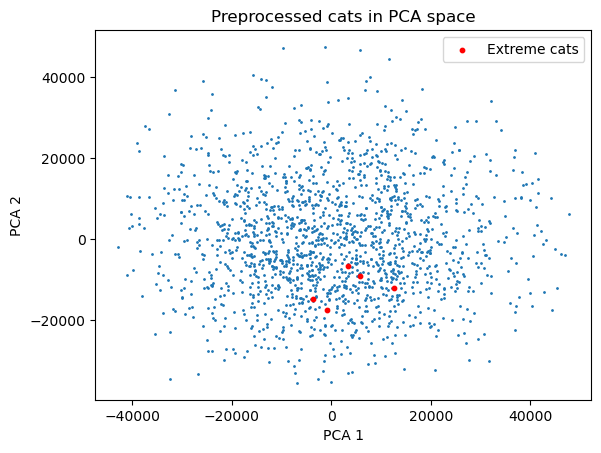

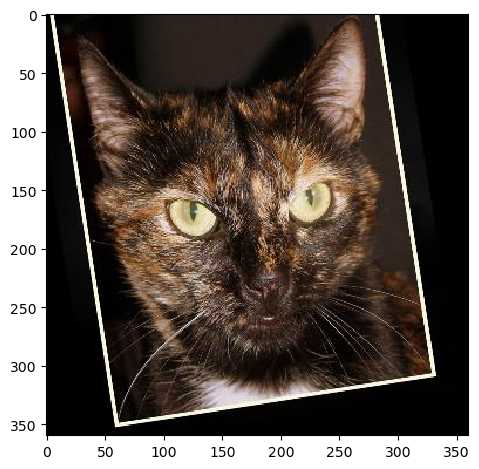

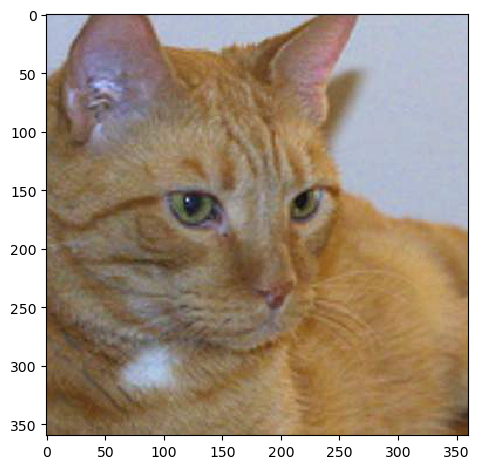

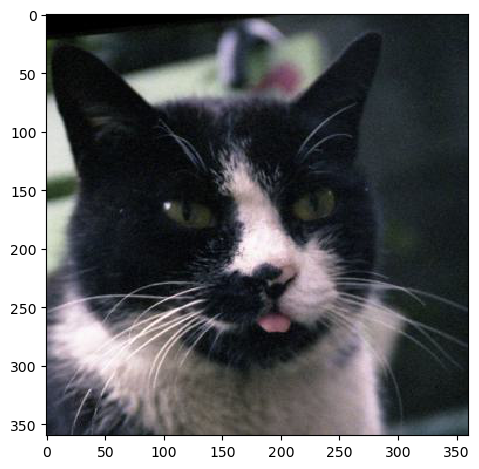

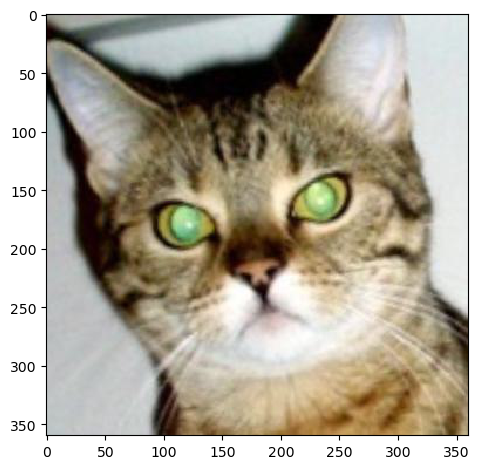

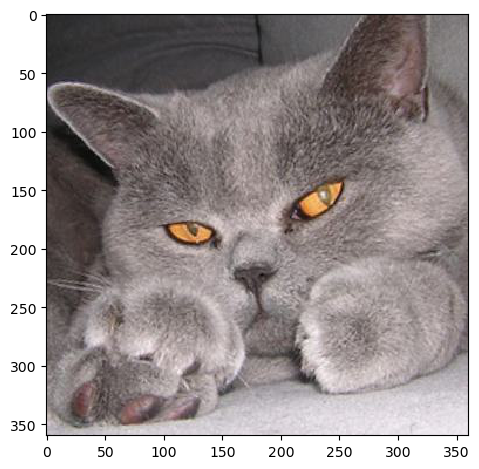

In [239]:
#Find the 5 closest cats to the missing cat in PCA space
distances = np.linalg.norm(data_matrix_pca_cleaned - pca_coords, axis=1)
closest_cats = np.argsort(distances)[:5]

scatter_cats(data_matrix_pca_cleaned, closest_cats)

#Plot the 5 closest cats
display_cats(data_matrix_cleaned, closest_cats)
